In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

import plotly
import plotly.offline as py
import plotly.graph_objs as go
import plotly_express as px

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


In [ ]:
# !wget https://www.dropbox.com/s/3x1w789mmuae3ao/yelp_academic_dataset_business.zip
# !unzip yelp_academic_dataset_business.zip

## Load the data

In [38]:
yelp_data = pd.read_json('yelp_academic_dataset_business.json', lines=True)
yelp_data.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,2818 E Camino Acequia Drive,Phoenix,AZ,85016,33.522143,-112.018481,3.0,5,0,{'GoodForKids': 'False'},"Golf, Active Life",None
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W..."
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-..."
3,xvX2CttrVhyG2z1dFg_0xw,Farmers Insurance - Paul Lorenz,"15655 W Roosevelt St, Ste 237",Goodyear,AZ,85338,33.455613,-112.395596,5.0,3,1,None,"Insurance, Financial Services","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ..."
4,HhyxOkGAM07SRYtlQ4wMFQ,Queen City Plumbing,"4209 Stuart Andrew Blvd, Ste F",Charlotte,NC,28217,35.190012,-80.887223,4.0,4,1,"{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...","Plumbing, Shopping, Local Services, Home Servi...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ..."


In [39]:
yelp_data.shape

(192609, 14)

# Exploratory Data Analaysis (EDA)

## Subset the data for restaurants

In [40]:
yelp_data['is_restaurant'] = yelp_data['categories'].str.contains('Restaurants')
yelp_data.head(5)

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,is_restaurant
0,1SWheh84yJXfytovILXOAQ,Arizona Biltmore Golf Club,2818 E Camino Acequia Drive,Phoenix,AZ,85016,33.522143,-112.018481,3.0,5,0,{'GoodForKids': 'False'},"Golf, Active Life",None,False
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",True
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",True
3,xvX2CttrVhyG2z1dFg_0xw,Farmers Insurance - Paul Lorenz,"15655 W Roosevelt St, Ste 237",Goodyear,AZ,85338,33.455613,-112.395596,5.0,3,1,None,"Insurance, Financial Services","{'Monday': '8:0-17:0', 'Tuesday': '8:0-17:0', ...",False
4,HhyxOkGAM07SRYtlQ4wMFQ,Queen City Plumbing,"4209 Stuart Andrew Blvd, Ste F",Charlotte,NC,28217,35.190012,-80.887223,4.0,4,1,"{'BusinessAcceptsBitcoin': 'False', 'ByAppoint...","Plumbing, Shopping, Local Services, Home Servi...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",False


In [41]:
restaurant_data = yelp_data.loc[yelp_data.is_restaurant == True]
restaurant_data.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,is_restaurant
1,QXAEGFB4oINsVuTFxEYKFQ,Emerald Chinese Restaurant,30 Eglinton Avenue W,Mississauga,ON,L5R 3E7,43.605499,-79.652289,2.5,128,1,"{'RestaurantsReservations': 'True', 'GoodForMe...","Specialty Food, Restaurants, Dim Sum, Imported...","{'Monday': '9:0-0:0', 'Tuesday': '9:0-0:0', 'W...",True
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",True
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,1,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...","Restaurants, Breakfast & Brunch, Mexican, Taco...","{'Monday': '7:0-0:0', 'Tuesday': '7:0-0:0', 'W...",True
13,fweCYi8FmbJXHCqLnwuk8w,Marco's Pizza,5981 Andrews Rd,Mentor-on-the-Lake,OH,44060,41.708520,-81.359556,4.0,16,1,"{'RestaurantsPriceRange2': '2', 'BusinessAccep...","Italian, Restaurants, Pizza, Chicken Wings","{'Monday': '10:0-0:0', 'Tuesday': '10:0-0:0', ...",True
17,PZ-LZzSlhSe9utkQYU8pFg,Carluccio's Tivoli Gardens,"1775 E Tropicana Ave, Ste 29",Las Vegas,NV,89119,36.100016,-115.128529,4.0,40,0,"{'OutdoorSeating': 'False', 'BusinessAcceptsCr...","Restaurants, Italian",None,True


In [42]:
restaurant_data.shape

(59371, 15)

## Review Stars Countplot

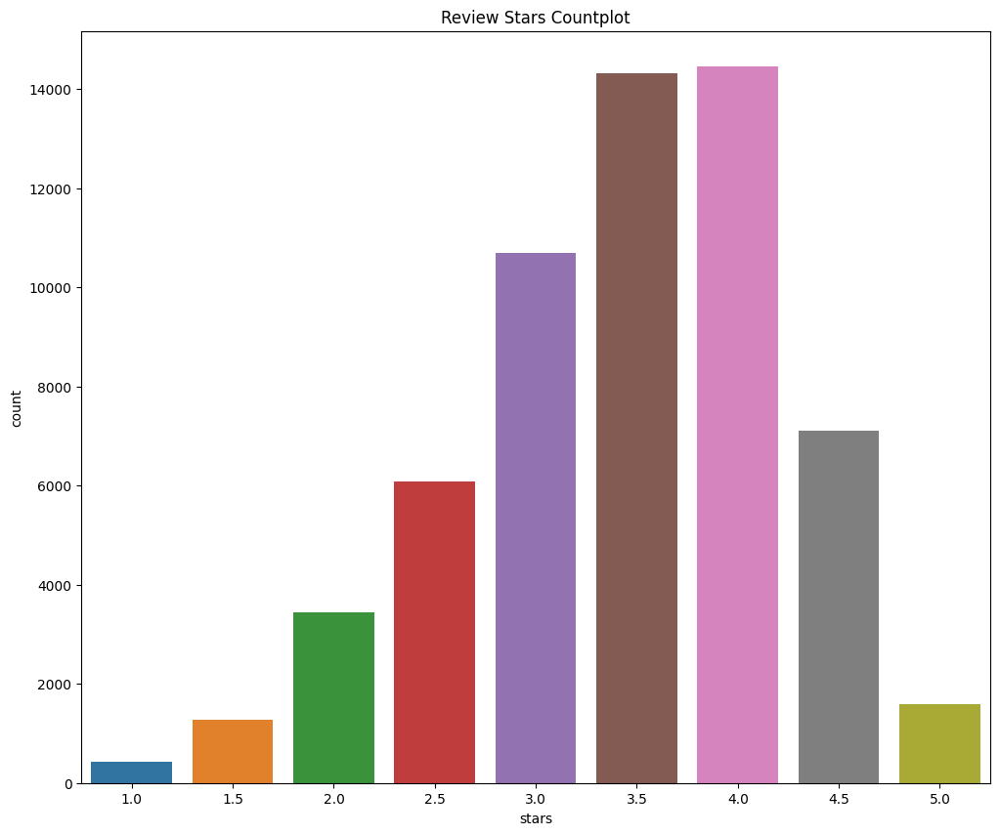

In [9]:
fig, ax = plt.subplots(figsize=(12,10))
sns.countplot(x=df_restaurants['stars'], ax=ax)
plt.title('Review Stars Countplot')
plt.show()

## Top 20 Restaurants by review count and stars

In [10]:
top_restaurants = df_restaurants.sort_values(by=['review_count', 'stars'], ascending=False)[:20]
top_restaurants.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants
82250,4JNXUYY8wbaaDmk3BPzlWw,Mon Ami Gabi,3655 Las Vegas Blvd S,Las Vegas,NV,89109,36.112859,-115.172434,4.0,8348,1,"{'Corkage': 'True', 'RestaurantsDelivery': 'Fa...","Food, French, Breakfast & Brunch, Restaurants,...","{'Monday': '7:0-23:0', 'Tuesday': '7:0-23:0', ...",True
89206,RESDUcs7fIiihp38-d6_6g,Bacchanal Buffet,3570 S Las Vegas Blvd,Las Vegas,NV,89109,36.116113,-115.176222,4.0,8339,1,"{'NoiseLevel': 'u'average'', 'HasTV': 'False',...","Restaurants, Buffets, Sandwiches, Food, Breakf...","{'Monday': '7:30-22:0', 'Tuesday': '7:30-22:0'...",True
35199,K7lWdNUhCbcnEvI0NhGewg,Wicked Spoon,3708 Las Vegas Blvd S,Las Vegas,NV,89109,36.109550,-115.176155,3.5,6708,1,"{'GoodForKids': 'True', 'RestaurantsPriceRange...","Buffets, Breakfast & Brunch, Restaurants","{'Monday': '8:0-21:0', 'Tuesday': '8:0-21:0', ...",True
58852,f4x1YBxkLrZg652xt2KR5g,Hash House A Go Go,3535 Las Vegas Blvd,Las Vegas,NV,89109,36.118181,-115.171580,4.0,5763,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Breakfast & Brunch, Food, Restaurants, America...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True
141820,cYwJA2A6I12KNkm2rtXd5g,Gordon Ramsay BurGR,3667 Las Vegas Blvd S,Las Vegas,NV,89109,36.110724,-115.172169,4.0,5484,0,"{'RestaurantsGoodForGroups': 'True', 'Alcohol'...","Restaurants, Burgers, American (Traditional)","{'Monday': '11:0-0:0', 'Tuesday': '11:0-0:0', ...",True


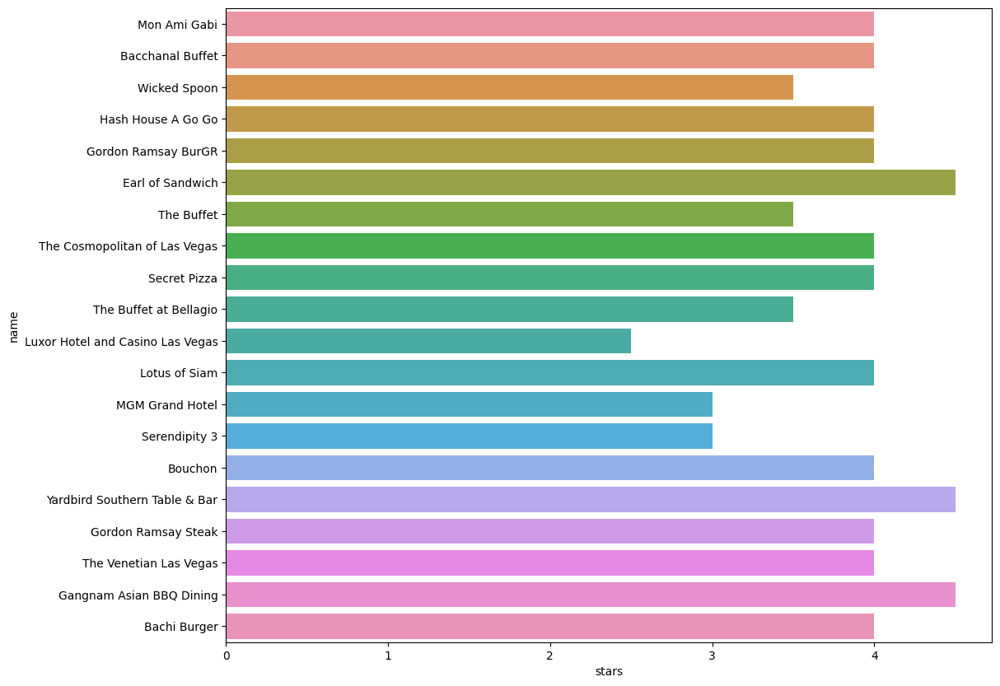

In [11]:
fig, ax = plt.subplots(figsize=(12,10))
sns.barplot(x = 'stars', y = 'name', data=top_restaurants, ax= ax);
plt.savefig('top20_restaurants.png')
plt.show()

## Scatter plot of restaurants on a Mapbox map


In [12]:
fig = px.scatter_mapbox(df_restaurants, lat="latitude", lon="longitude", color="stars", size='review_count',
                        size_max=30, zoom=3, width=1200, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


## Subset restaurants in Pennsylvania

In [14]:
restaurants_in_PA = restaurant_data[restaurant_data.state == 'PA']

## Scatter plot of Pennsylvania restaurants on a Mapbox map 

In [15]:
fig = px.scatter_mapbox(restaurants_in_PA, lat="latitude", lon="longitude", color="stars", size='review_count',
                        size_max=15, zoom=10, width=1200, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()


# K-Means Clustering

## Perform K-Means clustering on the latitude and longitude coordinates

In [16]:
coordinates = restaurants_in_PA[['longitude','latitude']]
distortions = []
K = range(1,25)
for k in K:
    kmeansModel = KMeans(n_clusters=k, n_init=10)
    kmeansModel = kmeansModel.fit(coords)
    distortions.append(kmeansModel.inertia_)


## Elbow Method to determine the optimal number of clusters (K)

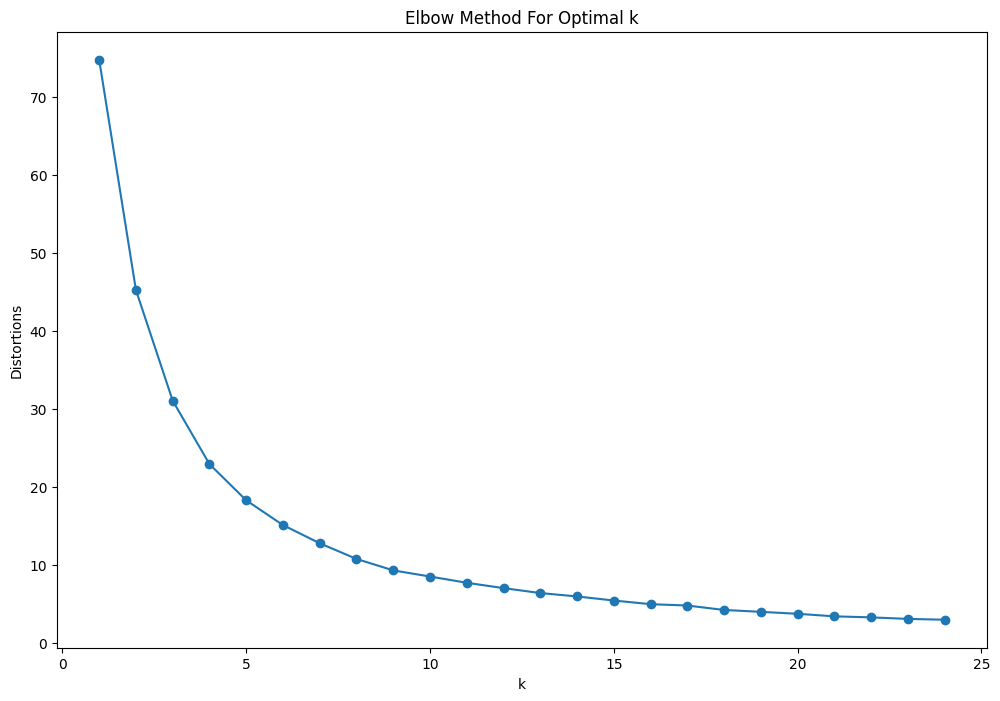

In [17]:
fig, ax = plt.subplots(figsize=(12, 8))
plt.plot(K, distortions, marker='o')
plt.xlabel('k')
plt.ylabel('Distortions')
plt.title('Elbow Method For Optimal k')
# plt.savefig('elbow.png')
plt.show()

## Silhouette Analysis to determine the quality of clustering

In [18]:
from sklearn.metrics import silhouette_score

sil = []
kmax = 50

# dissimilarity would not be defined for a single cluster, thus, minimum number of clusters should be 2
for k in range(2, kmax+1):
  kmeans = KMeans(n_clusters = k, n_init=10).fit(coords)
  labels = kmeans.labels_
  sil.append(silhouette_score(coords, labels, metric = 'euclidean'))

In [19]:
sil

[0.34211222490204474,
 0.42287296375305,
 0.43135414854652304,
 0.4524285464472247,
 0.4614266542280866,
 0.4021759300222259,
 0.4237291392576742,
 0.43246310912851776,
 0.4367253046262251,
 0.437430992081289,
 0.4334284785608988,
 0.44503662855548165,
 0.45312320118310945,
 0.45278064579216354,
 0.45593135561539083,
 0.4630277192602457,
 0.46311818797544296,
 0.4562551243859151,
 0.47260582534065176,
 0.4609898413155891,
 0.48130238204810416,
 0.45959638543048265,
 0.485962569754871,
 0.4827774613986869,
 0.45891514279546775,
 0.456486590067371,
 0.46918632336955174,
 0.44439655320388993,
 0.47581501669319015,
 0.4798495166383843,
 0.4768398934639215,
 0.4713667048247037,
 0.4880359256093925,
 0.4905733912568193,
 0.495740317373383,
 0.45700661651715563,
 0.4677406775931028,
 0.48873243121004817,
 0.49933347171537246,
 0.48151684150131796,
 0.49925788583611647,
 0.5015074383647691,
 0.5060712549232832,
 0.4815760415491932,
 0.49825191794506263,
 0.5176655926553845,
 0.4878409727522070

# Recommendation System

### Perform K-Means clustering with the optimal number of clusters

In [20]:
kmeans = KMeans(n_clusters=5,n_init=10, init='k-means++')
kmeans.fit(coords)
y = kmeans.labels_
print("k = 5", " silhouette_score ", silhouette_score(coords, y, metric='euclidean'))

k = 5  silhouette_score  0.45266421232235005


## Assign cluster labels to the Pennsylvania restaurants

In [26]:
restaurants_in_PA.loc[:, 'cluster'] = kmeans.predict(restaurants_in_PA[['longitude','latitude']]).copy()
restaurants_in_PA.head()


/var/folders/7v/01sf_wrn63dc35pm19bgsrqh0000gn/T/ipykernel_68244/1105006707.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,1,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...","Sandwiches, Salad, Restaurants, Burgers, Comfo...",None,True,3
66,dQj5DLZjeDK3KFysh1SYOQ,Apteka,4606 Penn Ave,Pittsburgh,PA,15224,40.465694,-79.949324,4.5,242,1,"{'CoatCheck': 'False', 'BusinessParking': '{'g...","Nightlife, Bars, Polish, Modern European, Rest...","{'Wednesday': '17:0-0:0', 'Thursday': '17:0-0:...",True,0
73,v-scZMU6jhnmV955RSzGJw,No. 1 Sushi Sushi,436 Market St,Pittsburgh,PA,15222,40.441062,-80.002126,4.5,106,1,"{'OutdoorSeating': 'False', 'HasTV': 'True', '...","Japanese, Sushi Bars, Restaurants","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'...",True,0
77,KFbUQ-RR2UOV62Ep7WnXHw,Westwood Bar & Grill,825 Commonwealth Ave,West Mifflin,PA,15122,40.376674,-79.882480,3.0,5,1,"{'GoodForMeal': '{'dessert': False, 'latenight...","American (Traditional), Restaurants","{'Wednesday': '11:0-0:0', 'Thursday': '11:0-0:...",True,0
147,t-6tdxRaz7s9a0sf94Tguw,Impressionz,6008 Broad St,Pittsburgh,PA,15206,40.462345,-79.924165,4.5,29,0,"{'RestaurantsDelivery': 'False', 'RestaurantsG...","Restaurants, Caribbean","{'Monday': '11:0-20:0', 'Tuesday': '11:0-20:0'...",True,0


## Scatter plot of Pennsylvania restaurants with cluster labels on a Mapbox map


In [27]:
fig = px.scatter_mapbox(restaurants_in_PA, lat="latitude", lon="longitude", color="cluster", size='review_count', 
                  hover_data= ['name', 'latitude', 'longitude'], zoom=10, width=1200, height=800)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()



## Location-Based Recommendation

In [28]:
top_restaurants_Penn = Penn.sort_values(by=['review_count', 'stars'], ascending=False)
top_restaurants_Penn.head()

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurants,cluster
61192,JLbgvGM4FXh9zNP4O5ZWjQ,Meat & Potatoes,649 Penn Ave,Pittsburgh,PA,15222,40.443145,-80.001104,4.0,1755,1,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Meat Shops, Food, Specialty Food, Steakhouses,...","{'Monday': '17:0-23:0', 'Tuesday': '17:0-22:0'...",True,0
27481,u4sTiCzVeIHZY8OlaL346Q,Gaucho Parrilla Argentina,1601 Penn Ave,Pittsburgh,PA,15222,40.449043,-79.987573,4.5,1618,1,"{'BusinessParking': '{'garage': False, 'street...","Argentine, Latin American, Restaurants, Seafood","{'Tuesday': '11:0-21:0', 'Wednesday': '11:0-21...",True,0
42153,lKom12WnYEjH5FFemK3M1Q,Primanti Bros,46 18th St,Pittsburgh,PA,15222,40.450706,-79.985588,3.5,1234,1,"{'Music': '{'dj': False, 'background_music': T...","Sandwiches, Restaurants, Botanical Gardens, Sp...","{'Monday': '0:0-0:0', 'Tuesday': '0:0-0:0', 'W...",True,0
34512,woXlprCuowrLJswWere3TQ,täkō,214 6th St,Pittsburgh,PA,15222,40.442229,-80.001985,4.5,1133,1,"{'WiFi': 'u'free'', 'RestaurantsPriceRange2': ...","Restaurants, American (New), Mexican","{'Monday': '17:0-22:0', 'Tuesday': '17:0-22:0'...",True,0
149137,dLc1d1zwd1Teu2QED5TmlA,Noodlehead,242 S Highland Ave,Pittsburgh,PA,15206,40.457748,-79.925494,4.5,1096,1,"{'RestaurantsDelivery': 'False', 'Alcohol': 'u...","Thai, Restaurants, Noodles, Food","{'Monday': '0:0-0:0', 'Tuesday': '12:0-22:0', ...",True,0


In [34]:
import warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=UserWarning)



## Define a function to recommend restaurants based on location

In [35]:
def recommend_restaurants(df, longitude, latitude):
    # Predict the cluster for longitude and latitude provided
    cluster = kmeans.predict(np.array([longitude,latitude]).reshape(1,-1))[0]
    print(cluster)
   
    # Get the best restaurant in this cluster
    return  df[df['cluster']==cluster].iloc[0:5][['name', 'latitude','longitude'	]]
   

In [36]:
recommend_restaurants(top_restaurants_Penn,-80.001104,  40.443145)

0


,name,latitude,longitude
61192,Meat & Potatoes,40.443145,-80.001104
27481,Gaucho Parrilla Argentina,40.449043,-79.987573
42153,Primanti Bros,40.450706,-79.985588
34512,täkō,40.442229,-80.001985
149137,Noodlehead,40.457748,-79.925494


## Scatter plot of recommended restaurants on a Mapbox map

In [37]:
fig = px.scatter_mapbox(recommend_restaurants(top_restaurants_Penn, -79.99315, 40.446156),
                        lat="latitude", lon="longitude", zoom=15, width=1200, height=800,
                        hover_data=['name', 'latitude', 'longitude'])
fig.add_scattermapbox(lat=[-79.99315], lon=[40.446156]).update_traces(dict(mode='markers', marker=dict(size=15)))

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()


0
